# <p style="background-color:#0051A5;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">CHURN PREDICTION FOR BANK CUSTOMERS</p>

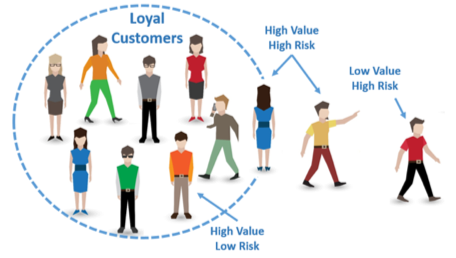

<p style="background-color:#0051A5;font-family:newtimeroman;color:#FFF9ED;font-size:100%;text-align:left;border-radius:10px 10px;">Image credit : Google/</p> 

<a id="toc"></a>

## <h3 style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;" class="list-group-item list-group-item-action active" data-toggle="list" role="tablist" aria-controls="home">TABLE OF CONTENTS</h3>

* [   PREFACE](#0)
* [1) LIBRARIES NEEDED IN THE STUDY](#1)
    * [1.1 User Defined Functions](#1.1)
* [2) DATA](#2)
    * [2.1 Context](#2.1)
    * [2.2 About the Features](#2.2) 
    * [2.3 What the Problem is](#2.3) 
* [3) ANALYSIS](#3)
    * [3.1) Reading the Data](#3)
* [4) EXPLORATORY DATA ANALYSIS (EDA) & VISUALIZATION](#4)
    * [4.1 - A General Looking at the Data](#4.1)
    * [4.2 - Convert Multi-Index Columns To One Level](#4.2)
    * [4.3 - Handling with Missing Values](#4.3)
    * [4.4 The Examination of Target Variable](#4.4)
    * [4.5 - The Examination of Skewness, Kurtosis & Multicollinearity](#4.5)
    * [4.6 Numerical vs. Categorical](#4.6)
        * [4.6.1 Spliting Dataset into Numeric & Categoric Features](#4.6.1)
        * [4.6.2 The Examination of Numerical Features](#4.6.2)
        * [4.6.3 The Examination of Categorical Features](#4.6.3)
        * [4.6.4 Dummy Operation](#4.6.4)  
    * [4.7 Descriptive Statistics](#4.7)
* [5) DATA PREPROCESSING](#5)
    * [5.1 Train|Test Split Operations](#5.1)
    * [5.2 Scaling Operation](#5.2)
* [6) MODELING & MODEL PERFORMANCE](#6) 
    * [6.1 Logistic Regression](#6.1)
    * [6.2 K-Nearest Neighbor](#6.2)
    * [6.3 Decision Tree Classifier](#6.3)
    * [6.4 Random Forest CLassifier](#6.4)
    * [6.5 ADABoost Classifier](#6.5)
    * [6.6 XGBoost Classifier](#6.6)
    * [6.7 CatBoost Classifier](#6.7)
    * [6.8 LGBM Classifier](#6.8)
    * [6.9 Neural Networks modeling without class weight](#6.8)
    * [6.9.1 The Evaluation of Model with Default Parameters (without class_weigth)](#6.1.1)
    * [6.9.2 Modeling With Best Parameters (GridsearchCV)](#6.3)
    * [6.9.3 The Evaluation of ROC and AUC for Model without "class_weigth"](#6.3.1)
    * [6.9.3 The Evaluation of ROC and AUC for GridsearchCV Model](#6.3.3)
    * [7) Final Model & Model Deployment](#7) 
    * [7.1 Voting for the Best Model and saving it](#7.1)
    * [7.2 Handling the class imbalance using Upsampling and building the model](#7.2)
   


<a id="0"></a>
## <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">PREFACE</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**In this file we are performing Customer Churn Analysis and predict which customers are most likely to churn and how we can stem attrition, this study will examine the dataset named as "Churn Modelling.csv" which is provided as part of assessment.**

**This study, in general, will cover wide variety of data analytics topics with in depth understanding of the dataset not only by examining its various aspects but also visualizing it as required.**

<a id="1"></a>
## <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">1 - LIBRARIES NEEDED IN THE STUDY</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**First, if you do not have the following libraries in your kernel, please install them since you have to need them to import some sub libraries.**

In [1]:
# !pip install pyforest
# !pip install ipython
# !pip install pyclustertend
# !pip install xlrd
# !pip install Autoviz
# !pip install colorama
# !pip3 install termcolor
# !pip install termcolor
# !pip install pandas-profiling

In [2]:
#importing some required libraries
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dropout
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix ,classification_report
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn import model_selection 
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from statistics import mean
import lightgbm as lgb
from sklearn.pipeline import Pipeline
import sklearn.model_selection as md
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from statistics import mean
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')
pd.set_option("display.max_columns", 101)

In [3]:
#Code section 1
%matplotlib inline
# %matplotlib notebook
plt.rcParams["figure.figsize"] = (12,6)
# plt.rcParams['figure.dpi'] = 100
sns.set_style("whitegrid")
#pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.options.display.float_format = '{:,.2f}'.format

# Importing plotly and cufflinks in offline mode
import plotly.express as px
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

# Ignore Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.warn("this will not show")

# Figure & Display options
plt.rcParams["figure.figsize"] = (10, 6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
import matplotlib.colors as mcolors
#pd.set_option('display.float_format', lambda x: '%.3f' % x)

from termcolor import colored
import missingno as msno 

import colorama
from colorama import Fore, Style  # maakes strings colored
from termcolor import colored, cprint

# Import Pandas Profiling
import pandas_profiling
from pandas_profiling import ProfileReport

<a id="1.1"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">1.1 User Defined Functions</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**I have defined some useful user defined functions which I will use through out the analyses**

In [4]:
###############################################################################

def missing(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

def missing_values(df):
    return missing(df)[missing(df)['Missing_Number']>0]

###############################################################################

def first_look(col):
    print("column name    : ", col)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col].isnull().sum()/df.shape[0]*100, 2))
    print("num_of_nulls   : ", df[col].isnull().sum())
    print("num_of_uniques : ", df[col].nunique())
    print(df[col].value_counts(dropna = False))

def first_looking(df):
    print(colored("Shape:", attrs=['bold']), df.shape,'\n',
          f"There is ", df.shape[0], " observation and ", df.shape[1], " columns in the dataset.", '\n',
          colored('-'*79, 'red', attrs=['bold']),
          colored("\nInfo:\n", attrs=['bold']), sep='')
    print(df.info(), '\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Number of Uniques:\n", attrs=['bold']), df.nunique(),'\n',
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Missing Values:\n", attrs=['bold']), missing_values(df),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("All Columns:", attrs=['bold']), list(df.columns),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')

    df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')

    print(colored("Columns after rename:", attrs=['bold']), list(df.columns),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')

def duplicate_values(df):
    duplicate_values = df.duplicated(subset=None, keep='first').sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep='first', inplace=True)
        print(duplicate_values, colored("duplicates were dropped", attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
    else:
        print(colored("No duplicates", attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_columns(df, drop_columns):
    if drop_columns !=[]:
        df.drop(drop_columns, axis=1, inplace=True)
        print(drop_columns, 'were dropped')
    else:
        print(colored('We will now check the missing values and if necessary drop some columns!!!', attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_null(df, limit):
    print('Shape:', df.shape)
    for i in df.isnull().sum().index:
        if (df.isnull().sum()[i]/df.shape[0]*100)>limit:
            print(df.isnull().sum()[i], 'percent of', i ,'null and were dropped')
            df.drop(i, axis=1, inplace=True)
            print('new shape:', df.shape)
        else:
            print(df.isnull().sum()[i], '%, percentage of missing values of', i ,'less than limit', limit, '%, so we will keep it.')
    print('New shape after missing value control:', df.shape)

###############################################################################

<a id="2"></a>
## <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">2 - DATA</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**During the preliminary analyses we can observe that, in this there are features depicting details of a bank's customers and the target variable is a binary variable reflecting the fact whether the customer left the bank (closed his account) or he continues to be a customer. Therefore, in this analyses I will try to predict behaviors/attributes to retain bank customers.**

**I have used several classification algorithm to predict the required answer**

<a id="2.1"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:left; border-radius:10px 10px;">2.1 Context</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Each row represents a bank customer, each column contains customer’s features described on the column Metadata.**

**The data set includes information about:**

- **Customers who left bank – the column/features is named "Exited"**
- **Customer account information that each customer has unique 'Customer_ID','Creditscore', 'Balance', 'Numofproducts', 'hascrcard',  'isactivemember'.**
- **Demographic info about customers  includes surname, geography, gender, age range, tenure and 'estimatedsalary'.**

<a id="2.2"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:left; border-radius:10px 10px;">2.2 About The Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**The features in the given dataset are:**

- **rownumber:** Row Numbers from 1 to 10000.

- **customerid:** A Unique Identifier that identifies each customer.

- **surname:** The Customer’s surname.

- **creditscore:** A credit score is a number between 300–850 that depicts a consumer's creditworthiness.

- **geography:** The country of Customers origin.

- **Gender:** The Customer’s gender: Male, Female

- **Age:** (Assumption) The Customer’s current age, in years, at the time of being customer.

- **Tenure:** The number of years for which the customer has been with the bank.


- **Balance:** Bank balance of the customer.

- **numofproducts:** the number of relationships with Bank.

- **hascrcard:** Does Customer is issued with a credit card (Binary Flag)

- **isactivemember:** Binary Flag for indicating if the client is active or not with the bank before the moment where the client exits the company (recorded in the variable "exited")

- **exited:** Binary flag 1 if the customer closed account with bank and 0 if the customer is retained.

<a id="2.3"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:left; border-radius:10px 10px;">2.3 What The Problem Is</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**- In the given study, we have a classification problem.**

- Based on the given data and initial analyses, I have a classification problem to solve.
- I will try to predict behaviors/attributes to retain bank customers on the target variable in the given dataset.
- The Dependant/ Target variable in the given dataset is "exited".
- I will perform initial data cleaning,feature selection and perform feature engineering.
- I will use machine learning models and neural network to classify the data.
- Lastly we will build a model to get best classification possible on the target variable via a voting classifier.
- For that we will examine whether the target variable is balanced or imbalanced.
- As our target variable has imbalanced data I will use Recall score and accuracy score to measure the data.

<a id="3"></a>
## <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">3 - ANALYSIS</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

<a id="3.1"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">3.1 Reading The Data</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**How to read and assign the dataset as df. [external link text](https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html)**

**- Observations from First glance at data.**

- The size of the file is 1.1 MB and Average record size in memory is 112 B.
- There are 14 columns/Features and 10000 rows in the given data set.
- There are only **3 missing values (<0.1%)** present in the feature Creditscore which is a good sign.
- There are **no duplicated rows** in the data set.
- There are **7 numerical features and 7 categorical features**.
- Features **RowNumber and CustomerId** have unique values through out.
- There are **2932** distinct surnames, 3 distinct geographic location and 3 gender values.
- Minimum age is 18 while maximum age 190 which seems to be an **outlier**.
- There are **3617 Zero values in the feature Balance contributing to 36.2%** of entire values.
- There are 4 distinct number of products, and is active member is a binary class
- The dependent variable exited is facing problem of **class imbalance with 7963 customers retained and 2037 customers     churned**.

**- Steps taken to clean the data and ensure performance.**

- Replacing missing values with the mean value.
- Using Upsampling technique SMOTE to handle class imbalance and increase accuracy.
- Using cross validation and gradient boosted trees to take care of outliers and overfitting.

In [5]:
# Readung the data and creating a copy of the data
df0 = pd.read_csv('Churn_Modeling.csv')
df = df0.copy()

In [6]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619.00,France,Female,42,2,0.00,1,1,1,"101,348.88",1
1,2,15647311,Hill,608.00,Spain,Female,41,1,"83,807.86",1,0,1,"112,542.58",0
2,3,15619304,Onio,502.00,France,Female,42,8,"159,660.80",3,1,0,"113,931.57",1
3,4,15701354,Boni,699.00,France,Female,39,1,0.00,2,0,0,"93,826.63",0
4,5,15737888,Mitchell,850.00,Spain,Female,43,2,"125,510.82",1,1,1,"79,084.10",0


<a id="4"></a>
## <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">4 - EXPLORATORY DATA ANALYSIS (EDA) & VISUALIZATION</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>


**Before performing Machine Learning algorithms, it is recommended that one needs to have complete understanding of the data. You need to perform casual statistical inferences, analyze frequency distributions of features, relationships and correlations between the independent variables and the dependent variable. It is recommended to apply data visualization techniques whenever required. Observing breakpoints helps you to internalize the data.**

**So, in this Exploratory Data Analysis section the data will be analyzed by summarizing its main characteristics, using statistical graphics and other data visualization methods. As such the reader will be familiar with what the data can tell.**

**The Framework in This Section:**

    1. Observe, infer and visualize each feature in the data set.
    2. Check for missing values
    3. Feature selection - Drop the features that not suitable for modeling.
    4. Implement basic visualization steps such as bar graphs, histogram, countplot, heatmap etc.
    5. Convert categorical variables to dummy variables or perform label encoding.

**You can use first_looking(df) user defined function above and profile_report() from a defined library for getting a general insight before going further in the analysis**

I have used Pandas profiling in this section. Pandas profiling is an open source Python module with which we can quickly do an exploratory data analysis with just a few lines of code. Similarly, for EDA, profile_report() is One-Line Magical Code creating reports in the interactive HTML format which is quite easy to understand and analyze the data. In short, at the first hand, what pandas profiling does is to save us all the work of visualizing and understanding the distribution of each variable.

**For a better understanding and more information, please refer to [external link text](https://www.analyticsvidhya.com/blog/2021/06/generate-reports-using-pandas-profiling-deploy-using-streamlit/) & [external link text](https://towardsdatascience.com/exploratory-data-analysis-with-pandas-profiling-de3aae2ddff3)**

In [7]:
#Generating the profile report as asked
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
#Calling the predefined functions
first_looking(df)

Shape:(10000, 14)
There is 10000 observation and 14 columns in the dataset.
-------------------------------------------------------------------------------
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      9997 non-null   float64
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  i

In [9]:
#visualizing rhe data frame
df.head(3)

,rownumber,customerid,surname,creditscore,geography,gender,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited
0,1,15634602,Hargrave,619.00,France,Female,42,2,0.00,1,1,1,"101,348.88",1
1,2,15647311,Hill,608.00,Spain,Female,41,1,"83,807.86",1,0,1,"112,542.58",0
2,3,15619304,Onio,502.00,France,Female,42,8,"159,660.80",3,1,0,"113,931.57",1


In [10]:
df.tail(3)

,rownumber,customerid,surname,creditscore,geography,gender,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited
9997,9998,15584532,Liu,709.00,France,Female,36,7,0.00,1,0,1,"42,085.58",1
9998,9999,15682355,Sabbatini,772.00,Germany,Male,42,3,"75,075.31",2,1,0,"92,888.52",1
9999,10000,15628319,Walker,792.00,France,Female,28,4,"130,142.79",1,1,0,"38,190.78",0


In [11]:
df.sample(10)

,rownumber,customerid,surname,creditscore,geography,gender,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited
8407,8408,15675626,Dawson,726.00,France,Male,28,2,0.00,1,0,0,"98,060.51",0
7398,7399,15577771,Akabueze,453.00,Germany,Female,40,1,"111,524.49",1,1,1,"120,373.84",1
373,374,15688074,Gregory,802.00,Germany,Male,31,1,"125,013.72",1,1,1,"187,658.09",0
3679,3680,15593897,Carr,650.00,Spain,Male,25,7,"160,599.06",2,1,1,"28,391.52",0
8319,8320,15624343,Napolitani,650.00,Spain,Female,50,7,"129,667.77",1,0,0,"42,028.16",0
5571,5572,15708867,Niu,684.00,Spain,Female,38,3,"134,168.50",3,1,0,"3,966.50",1
4404,4405,15766166,Folliero,604.00,Spain,Male,43,2,"145,081.72",1,1,1,"23,881.62",0
4162,4163,15673584,Bell,652.00,France,Female,74,5,0.00,2,1,1,937.15,0
6032,6033,15579787,Nkemakonam,686.00,France,Male,39,4,0.00,2,1,0,"155,023.93",0
1616,1617,15665695,Potter,594.00,France,Female,49,4,0.00,2,1,1,"23,631.55",0


In [12]:
#Checking for columns
df.columns

Index(['rownumber', 'customerid', 'surname', 'creditscore', 'geography',
       'gender', 'age', 'tenure', 'balance', 'numofproducts', 'hascrcard',
       'isactivemember', 'estimatedsalary', 'exited'],
      dtype='object')

In [13]:
print("There is", df.shape[0], "observation or rows and", df.shape[1], "columns in the dataset")

There is 10000 observation or rows and 14 columns in the dataset


In [14]:
df.shape

(10000, 14)

In [15]:
#Getting additional information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   rownumber        10000 non-null  int64  
 1   customerid       10000 non-null  int64  
 2   surname          10000 non-null  object 
 3   creditscore      9997 non-null   float64
 4   geography        10000 non-null  object 
 5   gender           10000 non-null  object 
 6   age              10000 non-null  int64  
 7   tenure           10000 non-null  int64  
 8   balance          10000 non-null  float64
 9   numofproducts    10000 non-null  int64  
 10  hascrcard        10000 non-null  int64  
 11  isactivemember   10000 non-null  int64  
 12  estimatedsalary  10000 non-null  float64
 13  exited           10000 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 1.1+ MB


In [16]:
#Converting all integer type variables to type float
df= df.apply(lambda x: x.astype(float) if x.dtype=="int64" else x)

In [17]:
#Checking again
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   rownumber        10000 non-null  float64
 1   customerid       10000 non-null  float64
 2   surname          10000 non-null  object 
 3   creditscore      9997 non-null   float64
 4   geography        10000 non-null  object 
 5   gender           10000 non-null  object 
 6   age              10000 non-null  float64
 7   tenure           10000 non-null  float64
 8   balance          10000 non-null  float64
 9   numofproducts    10000 non-null  float64
 10  hascrcard        10000 non-null  float64
 11  isactivemember   10000 non-null  float64
 12  estimatedsalary  10000 non-null  float64
 13  exited           10000 non-null  float64
dtypes: float64(11), object(3)
memory usage: 1.1+ MB


In [18]:
df.head(3)

,rownumber,customerid,surname,creditscore,geography,gender,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited
0,1.00,"15,634,602.00",Hargrave,619.00,France,Female,42.00,2.00,0.00,1.00,1.00,1.00,"101,348.88",1.00
1,2.00,"15,647,311.00",Hill,608.00,Spain,Female,41.00,1.00,"83,807.86",1.00,0.00,1.00,"112,542.58",0.00
2,3.00,"15,619,304.00",Onio,502.00,France,Female,42.00,8.00,"159,660.80",3.00,1.00,0.00,"113,931.57",1.00


**Let's remove the columns of "rownumber", "customerid", "surname" from the given dataset since they do NOT have any contribution to classification in our analysis.**

In [19]:
#Dropping unwanted columns
df.drop(["rownumber", "customerid", "surname"], axis=1, inplace=True)

In [20]:
#Checking the data frame after deleting the non essential columns
df.head(3)

,creditscore,geography,gender,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited
0,619.00,France,Female,42.00,2.00,0.00,1.00,1.00,1.00,"101,348.88",1.00
1,608.00,Spain,Female,41.00,1.00,"83,807.86",1.00,0.00,1.00,"112,542.58",0.00
2,502.00,France,Female,42.00,8.00,"159,660.80",3.00,1.00,0.00,"113,931.57",1.00


**Let's get rid of commas in the column of "balance" and "estimatedsalary"**

In [21]:
pd.options.display.float_format = '{:}'.format

In [22]:
df.head(3)

,creditscore,geography,gender,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited
0,619.0,France,Female,42.0,2.0,0.0,1.0,1.0,1.0,101348.88,1.0
1,608.0,Spain,Female,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0.0
2,502.0,France,Female,42.0,8.0,159660.8,3.0,1.0,0.0,113931.57,1.0


In [23]:
#Casual statistical inference
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu').format('{:.2f}')


,count,mean,std,min,25%,50%,75%,max
creditscore,9997.00,650.50,96.71,305.00,584.00,652.00,718.00,865.00
age,10000.00,38.94,10.61,18.00,32.00,37.00,44.00,190.00
tenure,10000.00,5.02,2.90,0.00,3.00,5.00,7.25,30.00
balance,10000.00,76485.89,62397.41,0.00,0.00,97198.54,127644.24,250898.09
numofproducts,10000.00,1.53,0.58,1.00,1.00,1.00,2.00,4.00
hascrcard,10000.00,0.71,0.46,0.00,0.00,1.00,1.00,1.00
isactivemember,10000.00,0.52,0.50,0.00,0.00,1.00,1.00,1.00
estimatedsalary,10000.00,100090.24,57510.49,11.58,51002.11,100193.91,149388.25,199992.48
exited,10000.00,0.20,0.40,0.00,0.00,0.00,0.00,1.00


In [24]:
#Casual statistical inference for features with object data type
df.describe(include=object).T

,count,unique,top,freq
geography,10000,3,France,5014
gender,10000,3,Male,5453


In [25]:
#Getting unique values
df.nunique()

creditscore         462
geography             3
gender                3
age                  72
tenure               12
balance            6382
numofproducts         4
hascrcard             2
isactivemember        2
estimatedsalary    9999
exited                2
dtype: int64

In [26]:
# to find how many unique values numerical features have
print("Brief Analysis")
for col in df.select_dtypes(include=[np.number]).columns:
    print(colored(f"{col}", 'green', attrs=['bold']), f"feature has", colored(f"{df[col].nunique()}", 'green', attrs=['bold']), f"unique values.")

Brief Analysis
creditscore feature has 462 unique values.
age feature has 72 unique values.
tenure feature has 12 unique values.
balance feature has 6382 unique values.
numofproducts feature has 4 unique values.
hascrcard feature has 2 unique values.
isactivemember feature has 2 unique values.
estimatedsalary feature has 9999 unique values.
exited feature has 2 unique values.


In [27]:
# to find how many unique values object features have
print("Brief Analysis")
for col in df.select_dtypes(include="object").columns:
    print(colored(f"{col}", 'green', attrs=['bold']), f"feature has", colored(f"{df[col].nunique()}", 'green', attrs=['bold']), f"unique values.")

Brief Analysis
geography feature has 3 unique values.
gender feature has 3 unique values.


In [28]:
#Cheking for duplicated value counts
df.duplicated().value_counts()

False    10000
dtype: int64

In [29]:
df.shape

(10000, 11)

<a id="4.3"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.3 Handling With Missing Values</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**1) Missing data (or missing values) is defined as the data value that is not present or stored for a variable in the observation of interest.**

**2) The problem of missing data is relatively common across almost all research and analysis problems and can have a significant effect on the conclusions that can be drawn from the data. Thus We need to focus on handling the missing data, problems caused by missing data, and the methods to avoid or minimize their effects on the analysis. Otherwise, missing data can reduce the statistical power of a study and can produce biased estimates, leading to invalid conclusions.**


**A General Look At The Missing Values**

In [30]:
#Calling the inbuilt function to calculate the missing values
missing(df)

,Missing_Number,Missing_Percent
creditscore,3,0.0003
geography,0,0.0
gender,0,0.0
age,0,0.0
tenure,0,0.0
balance,0,0.0
numofproducts,0,0.0
hascrcard,0,0.0
isactivemember,0,0.0
estimatedsalary,0,0.0


**Fortunately we have less missing values in the dataset. We have 3 values which are missing from feature Creditscore**

**Let's examine missing values visually.**

In [31]:
df.isnull().melt(value_name="missing")

,variable,missing
0,creditscore,False
1,creditscore,False
2,creditscore,False
3,creditscore,False
4,creditscore,False
...,...,...
109995,exited,False
109996,exited,False
109997,exited,False
109998,exited,False


**Filling the missing values with mean.**

In [32]:
#Filling  missing value of feature credit score with mean value
df['creditscore']=df['creditscore'].fillna(df['creditscore'].mean())

<Figure size 288x432 with 0 Axes>

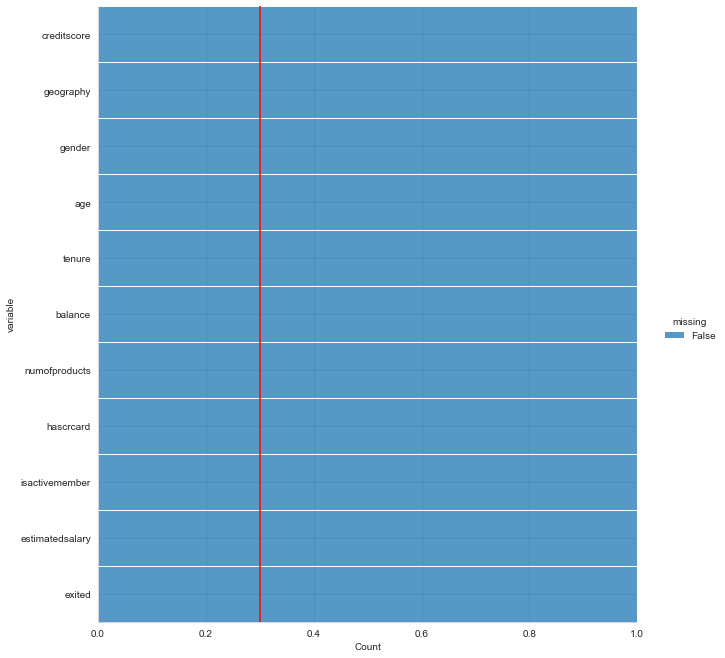

In [33]:
plt.figure(figsize=(4, 6))

sns.displot(data=df.isnull().melt(value_name="missing"),
            y="variable",
            hue="missing",
            multiple="fill",
            height=9.25)

plt.axvline(0.3, color="r");

<a id="4.4"></a>
### <p style="background-color:#9c2162; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.4 The Examination of Target Variable</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Feature named 'exited' is the dependent variable and lets understand the dependent variable.**

In [34]:
# Let's take a quick look at Target variable

first_look('exited')

column name    :  exited
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  2
0.0    7963
1.0    2037
Name: exited, dtype: int64


(array([7963.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        2037.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

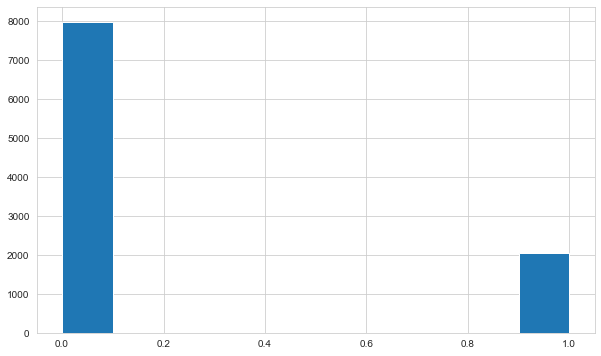

In [35]:
#Plotting the dependent variable exited
plt.hist(df['exited'])


**Overall Distribution of Target ("exited") Variable.**

Percentage of "being churn": % 20.37 --> (2037 churn cases out of 10000)
Percentage of "NOT being churn": % 79.63 --> (7963 NOT churn cases out of 10000)


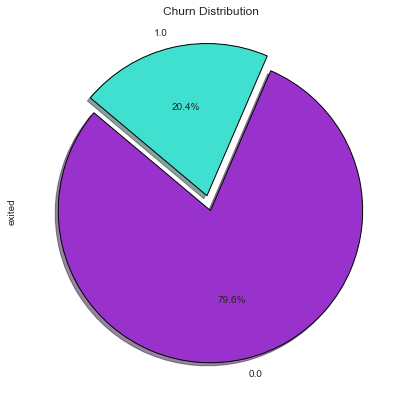

In [36]:
#Printing the Pie chart for dependent variable

y = df['exited']

print(f'Percentage of \033[1m"being churn"\033[0m: % {round(y.value_counts(normalize=True)[1]*100,2)} --> \
({y.value_counts()[1]} churn cases out of {len(df)})\nPercentage of \033[1m"NOT being churn"\033[0m: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} NOT churn cases out of {len(df)})')

explode = [0, 0.1]

df["exited"].value_counts().plot(kind="pie", 
                                 autopct='%1.1f%%', 
                                 figsize=(7, 7), 
                                 explode=explode, 
                                 wedgeprops={'edgecolor': 'black'}, 
                                 shadow=True, 
                                 colors = ['darkorchid', 'turquoise'], 
                                 startangle=140)
plt.title('Churn Distribution');

In [37]:
plt.figure(figsize=(4, 2))
df['exited'].iplot(kind='hist')

<Figure size 288x144 with 0 Axes>

**As we can derive from the plots, we have an imbalanced data.**

**% 20.4 of customers, who represent 2037 people out of 10000, didn't show loyalty to the company and got churned while % 79.6 of which representing 7960 people out of 10000 showed loyalty to the company.**

In [38]:
df[df['exited']==0].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
creditscore,7963.00,651.86,95.63,405.00,585.00,653.00,718.00,865.00
age,7963.00,37.44,10.29,18.00,31.00,36.00,41.00,190.00
tenure,7963.00,5.03,2.88,0.00,3.00,5.00,7.00,10.00
balance,7963.00,72745.30,62848.04,0.00,0.00,92072.68,126410.28,221532.80
numofproducts,7963.00,1.54,0.51,1.00,1.00,2.00,2.00,3.00
hascrcard,7963.00,0.71,0.46,0.00,0.00,1.00,1.00,1.00
isactivemember,7963.00,0.55,0.50,0.00,0.00,1.00,1.00,1.00
estimatedsalary,7963.00,99738.39,57405.59,90.07,50783.49,99645.04,148609.96,199992.48
exited,7963.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [39]:
df[df['exited']==1].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
creditscore,2037.00,645.18,100.60,305.00,578.00,646.00,716.00,850.00
age,2037.00,44.84,9.76,18.00,38.00,45.00,51.00,84.00
tenure,2037.00,4.95,2.99,0.00,2.00,5.00,8.00,30.00
balance,2037.00,91108.54,58360.79,0.00,38340.02,109349.29,131433.33,250898.09
numofproducts,2037.00,1.48,0.80,1.00,1.00,1.00,2.00,4.00
hascrcard,2037.00,0.70,0.46,0.00,0.00,1.00,1.00,1.00
isactivemember,2037.00,0.36,0.48,0.00,0.00,0.00,1.00,1.00
estimatedsalary,2037.00,101465.68,57912.42,11.58,51907.72,102460.84,152422.91,199808.10
exited,2037.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00


In [40]:
#Printing Skew
print( f"Skewness: {df['exited'].skew()}")

Skewness: 1.4716106649378211


In [41]:
#Printing Kurtosis
print( f"Kurtosis: {df['exited'].kurtosis()}")

Kurtosis: 0.16567104336407112


<a id="4.5"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.5 - The Examination of Skewness, Kurtosis & Multicollinearity</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Skewness**

In [42]:
#working with skewness
df_skew_temp = df.skew()
df_skew_temp = pd.DataFrame(df_skew_temp, columns=["skewness_value"])
df_skew_temp

,skewness_value
creditscore,-0.07492113698005425
age,1.2781702979582057
tenure,0.07197952064177922
balance,-0.14110871094154384
numofproducts,0.7455678882823168
hascrcard,-0.9018115952400578
isactivemember,-0.06043662833499078
estimatedsalary,0.0020853576615585162
exited,1.4716106649378211


**Interpreting Skewness**

0.5 is our threshold-limit to evaluate skewness. However, overall below abs(1) seems acceptable for the linear models.

In [43]:
symetric_features = []
moderate_skewed_features = []
highly_skewed_features = []

for col, skew in df_skew_temp.iterrows():
        if -0.5 < skew[0] < 0.5:
            symetric_features.append(col)
            print(f"The skewness value of", colored(f"{skew[0]}", 'green', attrs=['bold']), "for", colored(f"{col}", 'green', attrs=['bold']), "feature means that the distribution is approx.", colored(f"symmetric", 'green', attrs=['bold']))
        elif (-0.5 < skew[0] < -1.0) or (0.5 < skew[0] < 1.0):  
            moderate_skewed_features.append(col)
            print(f"The skewness value of", colored(f"{skew[0]}", 'yellow', attrs=['bold']), "for", colored(f"{col}", 'yellow', attrs=['bold']), "feature means that the distribution is approx.", colored(f"moderately symmetric", 'yellow', attrs=['bold']))
        else:
            highly_skewed_features.append(col)
            print(f"The skewness value of", colored(f"{skew[0]}", 'red', attrs=['bold']), "for", colored(f"{col}", 'red', attrs=['bold']), "feature means that the distribution is approx.", colored(f"highly symmetric", 'red', attrs=['bold']))

print(colored('*'*120, 'cyan', attrs=['bold']))
print("\033[1mThe number of symetric features:\033[0m", len(symetric_features))
print("\033[1mThe number of moderately skewed features:\033[0m", len(moderate_skewed_features)) 
print("\033[1mThe number of highly skewed features:\033[0m", len(highly_skewed_features)) 

The skewness value of -0.07492113698005425 for creditscore feature means that the distribution is approx. symmetric
The skewness value of 1.2781702979582057 for age feature means that the distribution is approx. highly symmetric
The skewness value of 0.07197952064177922 for tenure feature means that the distribution is approx. symmetric
The skewness value of -0.14110871094154384 for balance feature means that the distribution is approx. symmetric
The skewness value of 0.7455678882823168 for numofproducts feature means that the distribution is approx. moderately symmetric
The skewness value of -0.9018115952400578 for hascrcard feature means that the distribution is approx. highly symmetric
The skewness value of -0.06043662833499078 for isactivemember feature means that the distribution is approx. symmetric
The skewness value of 0.0020853576615585162 for estimatedsalary feature means that the distribution is approx. symmetric
The skewness value of 1.4716106649378211 for exited feature me

**Kurtosis**

**Some Relevant Information**

"Skewness assesses the extent to which a variable’s distribution is symmetrical. If the distribution of responses for a variable stretches toward the right or left tail of the distribution, then the distribution is referred to as skewed. Kurtosis is a measure of whether the distribution is too peaked (a very narrow distribution with most of the responses in the center)." (Hair et al., 2017, p. 61).

Source - https://www.smartpls.com/documentation/functionalities/excess-kurtosis-and-skewness/

When both skewness and kurtosis are zero (a situation that researchers are very unlikely to ever encounter), the pattern of responses is considered a normal distribution.

Kurtosis are of three types:

**Mesokurtic**: When the tails of the distibution is similar to the normal distribution then it is mesokurtic. The kutosis for normal distibution is 3.

**Leptokurtic**: If the kurtosis is greater than 3 then it is leptokurtic. In this case, the tails will be heaviour than the normal distribution which means lots of outliers are present in the data. It can be recognized as thin bell shaped distribution with peak higher than normal distribution.

**Platykurtic**: Kurtosis will be less than 3 which implies thinner tail or lack of outliers than normal distribution.In case of platykurtic, bell shaped distribution will be broader and peak will be lower than the mesokurtic.  There is a argument  that data is considered to be normal if Skewness is between ‐2 to +2 and Kurtosis is between ‐7 to +7.

Multi-normality data tests are performed using leveling asymmetry tests (skewness < 3), (Kurtosis between -2 and 2) and Mardia criterion (< 3). 

Skewness and kurtosis index were used to identify the normality of the data. The result suggested the deviation of data from normality was not severe as the value of skewness and kurtosis index were below 3 and 10 respectively.

**Interpreting Kurtosis**

2.0 is our threshold-limit to evaluate kurtosis.

In [44]:
#Calculating Kurtosis 

kurtosis_limit = 2 
kurtosis_vals = df.kurtosis()
kurtosis_cols = kurtosis_vals[abs(kurtosis_vals) > kurtosis_limit].sort_values(ascending=False)
kurtosis_cols

age   5.4050652745115
dtype: float64

**Multicollinearity**

Let's first plot the heatmap and examine the correlations among the features visually. 

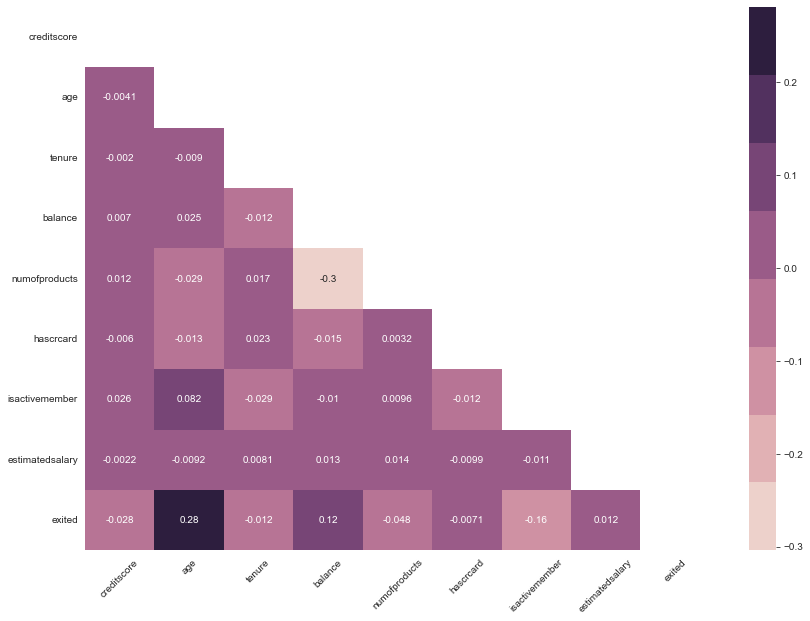

In [45]:
plt.figure(figsize=(14, 10))

# Getting the Upper Triangle of the co-relation matrix
matrix = np.triu(df.corr())

# using the upper triangle matrix as mask 
sns.heatmap(df.corr(), annot=True, cmap = sns.cubehelix_palette(8), mask=matrix)

plt.xticks(rotation=45);

Let's check if there is a multicollinearity problem among the features.

In [46]:
#Checking for existance of multicollinearity problem
df_temp = df.corr()

feature =[]
collinear=[]

for col in df_temp.columns:
    for i in df_temp.index:
        if (df_temp[col][i]> .85 and df_temp[col][i] < 1) or (df_temp[col][i]< -.85 and df_temp[col][i] > -1) :
                feature.append(col)
                collinear.append(i)
                print(Fore.RED + f"\033[1mmulticolinearity alert\033[0m between {col} - {i}")
        else:
            print(f"For {col} and {i}, there is \033[1mNO multicollinearity problem\033[0m") 

unique_list = list(set(feature+collinear))

print(colored('*'*80, 'cyan', attrs=['bold']))
print("\033[1mThe total number of strong corelated features:\033[0m", len(unique_list)) 

For creditscore and creditscore, there is NO multicollinearity problem
For creditscore and age, there is NO multicollinearity problem
For creditscore and tenure, there is NO multicollinearity problem
For creditscore and balance, there is NO multicollinearity problem
For creditscore and numofproducts, there is NO multicollinearity problem
For creditscore and hascrcard, there is NO multicollinearity problem
For creditscore and isactivemember, there is NO multicollinearity problem
For creditscore and estimatedsalary, there is NO multicollinearity problem
For creditscore and exited, there is NO multicollinearity problem
For age and creditscore, there is NO multicollinearity problem
For age and age, there is NO multicollinearity problem
For age and tenure, there is NO multicollinearity problem
For age and balance, there is NO multicollinearity problem
For age and numofproducts, there is NO multicollinearity problem
For age and hascrcard, there is NO multicollinearity problem
For age and isa

<a id="4.5"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.5 - Correlation Matrix </p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

<AxesSubplot:>

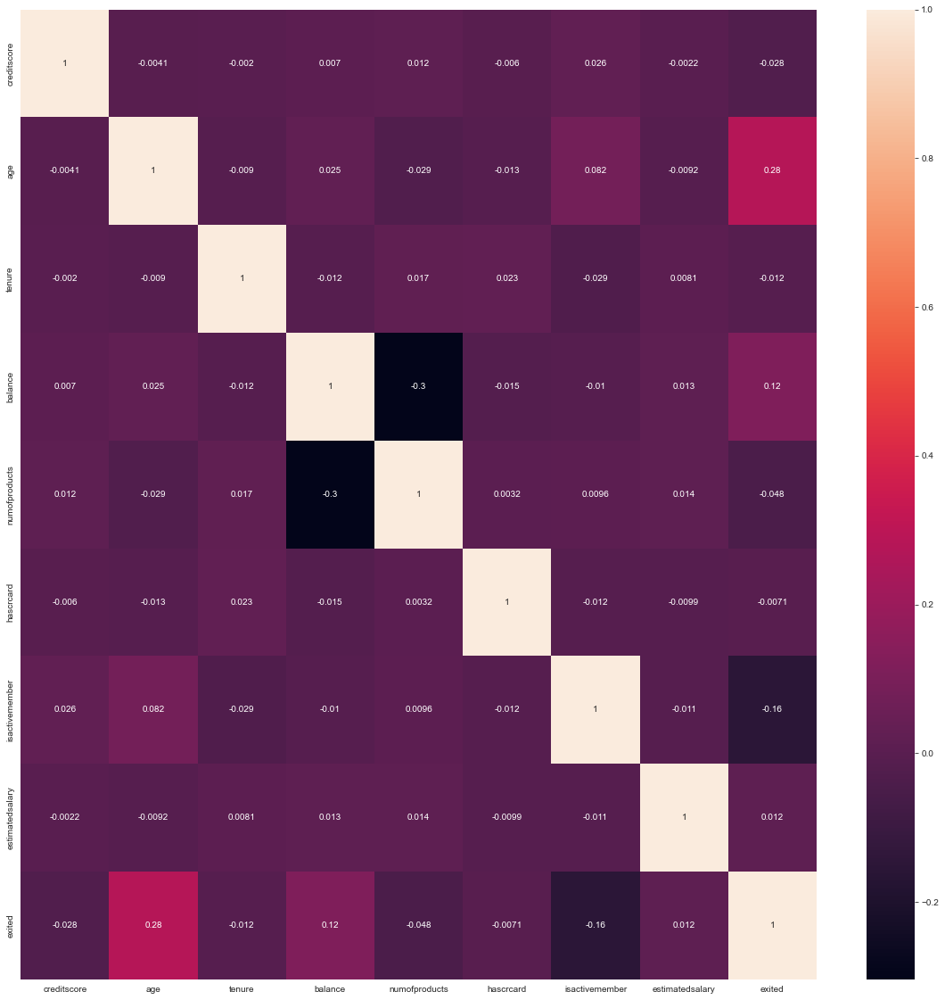

In [47]:
plt.figure(figsize=(20,20))
churn_corr = df.corr()
churn_corr_top = churn_corr.index
sns.heatmap(df[churn_corr_top].corr(), annot=True)

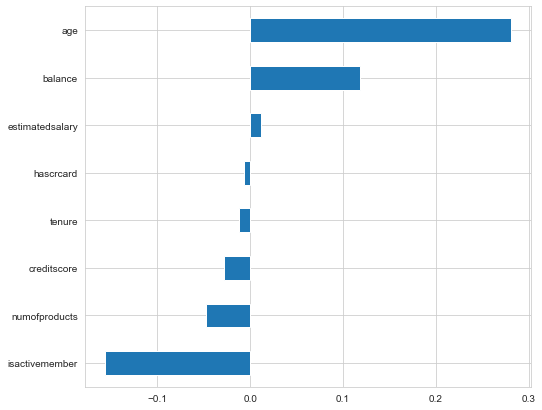

In [48]:
#Plotting correlation for the dependent variable exited
plt.figure(figsize = (8, 7))
df.corr()['exited'].sort_values().drop("exited").plot(kind = "barh");

Text(0.5, 1.0, 'Top 11 Features')

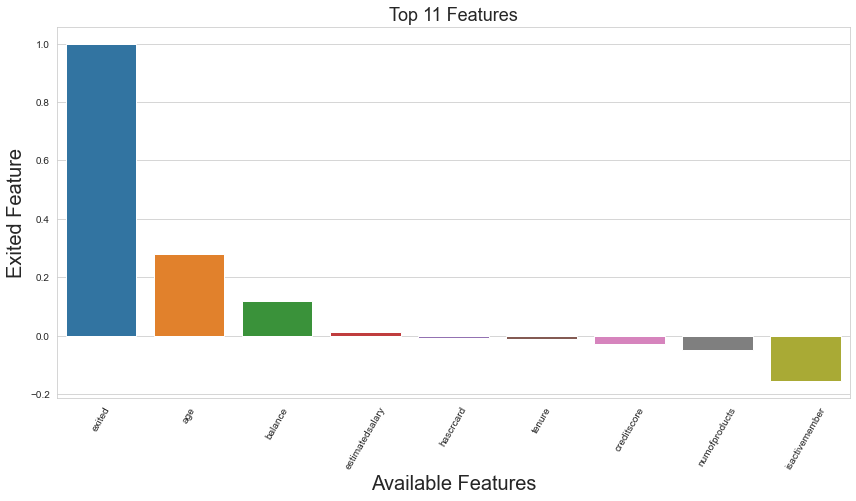

In [49]:
#Identifying top 10 important features
Correlation_mat_temp=df.corr()
#Copying columns names for index
Correlation_mat_temp['Avali_feature'] = Correlation_mat_temp.index

plt.figure(figsize=(12,6))
sns.color_palette("Paired")
sns.barplot(x='Avali_feature',
            y="exited",  
            order=Correlation_mat_temp.sort_values('exited', ascending = False).Avali_feature,
            data=Correlation_mat_temp,
           )
plt.xlabel("Available Features", size=20)
plt.ylabel("Exited Feature", size=20)
plt.tight_layout()
plt.xticks(rotation=60)
plt.title("Top 11 Features", size=18)

**Following observations can be noted from above correlation matrix and bar chart,
1)It can be concluded that there is a weak correlations between the numerical features and the target variable. So, even if we accept the level of 0.80 as base criteria for rejection levels for multicollinearity, it can be concluded that there is no multi-colliniearity problem among the variables".**

**2)On the other hand it can be safely assumed that while our target variable of 'exited' demonstrates a slight negative correlation with the variables of "creditscore", "tenure", "numberofproducts", 'hascrcard' and 'isactivemember', it  demonstrates slight positive correlation with the variables of 'age', 'balance' and 'estimatedsalary".**

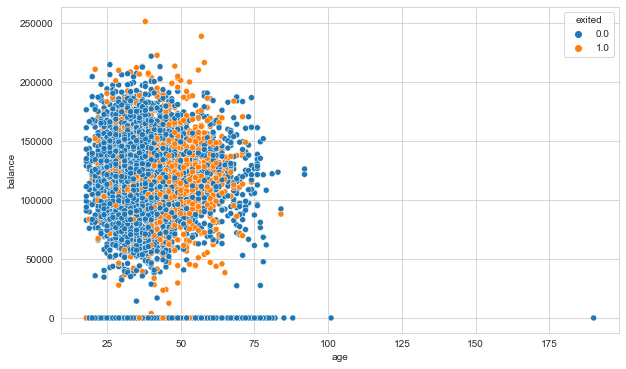

In [50]:
#Plotting the scatter plot with top 2 variables with highest correlation

sns.scatterplot(data=df, x="age", y="balance", hue="exited");

<a id="4.6"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6 Analyses of Numerical vs. Categorical features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

<a id="4.6.1"></a>
#### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6.1 Splitting Dataset into Numeric & Categoric Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [51]:
df.dtypes

creditscore        float64
geography           object
gender              object
age                float64
tenure             float64
balance            float64
numofproducts      float64
hascrcard          float64
isactivemember     float64
estimatedsalary    float64
exited             float64
dtype: object

In [52]:
# A simple code to identiy Numerical and Categroical features in our dataset

numerical= df.drop(['exited'], axis=1).select_dtypes('number').columns

categorical = df.select_dtypes('object').columns

print(colored("Numerical Columns:", attrs=['bold']), list(df[numerical].columns),'\n',
              colored('-'*124, 'red', attrs=['bold']), sep='')
print(colored("Categorical Columns:", attrs=['bold']), list(df[categorical].columns),'\n',
              colored('-'*124, 'red', attrs=['bold']), sep='')

Numerical Columns:['creditscore', 'age', 'tenure', 'balance', 'numofproducts', 'hascrcard', 'isactivemember', 'estimatedsalary']
----------------------------------------------------------------------------------------------------------------------------
Categorical Columns:['geography', 'gender']
----------------------------------------------------------------------------------------------------------------------------


<a id="4.6.2"></a>
#### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6.2 The Examination of Numerical Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [53]:
df[numerical].head().T

,0,1,2,3,4
creditscore,619.0,608.0,502.0,699.0,850.0
age,42.0,41.0,42.0,39.0,43.0
tenure,2.0,1.0,8.0,1.0,2.0
balance,0.0,83807.86,159660.8,0.0,125510.82
numofproducts,1.0,1.0,3.0,2.0,1.0
hascrcard,1.0,0.0,1.0,0.0,1.0
isactivemember,1.0,1.0,0.0,0.0,1.0
estimatedsalary,101348.88,112542.58,113931.57,93826.63,79084.1


In [54]:
df[numerical].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
creditscore,10000.00,650.50,96.69,305.00,584.00,652.00,717.25,865.00
age,10000.00,38.94,10.61,18.00,32.00,37.00,44.00,190.00
tenure,10000.00,5.02,2.90,0.00,3.00,5.00,7.25,30.00
balance,10000.00,76485.89,62397.41,0.00,0.00,97198.54,127644.24,250898.09
numofproducts,10000.00,1.53,0.58,1.00,1.00,1.00,2.00,4.00
hascrcard,10000.00,0.71,0.46,0.00,0.00,1.00,1.00,1.00
isactivemember,10000.00,0.52,0.50,0.00,0.00,1.00,1.00,1.00
estimatedsalary,10000.00,100090.24,57510.49,11.58,51002.11,100193.91,149388.25,199992.48


In [55]:
#Plotting graphs for all numerical features
df[numerical].iplot(kind='histogram', subplots=True, bins=50)

1.0    7055
0.0    2945
Name: hascrcard, dtype: int64
The total number of customers that do not have a credit card is 2945
The total number of customers that have a credit card is 7055


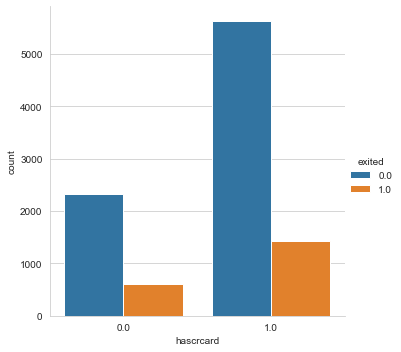

In [56]:
#identifying how many unique values are present in HasCrCard variable
print(df["hascrcard"].value_counts())

print("\033[1mThe total number of customers that do not have a credit card is", df["hascrcard"].value_counts()[0]) 
print("\033[1mThe total number of customers that have a credit card is", df["hascrcard"].value_counts()[1]) 

#Plotting the number of customers along  HasCrCard variable with exited variable as a filter
sns.catplot(x='hascrcard',hue='exited',data=df,kind="count")

1.0    5151
0.0    4849
Name: isactivemember, dtype: int64
The total number of customers that are not active is is 4849
The total number of customers that are active is 5151


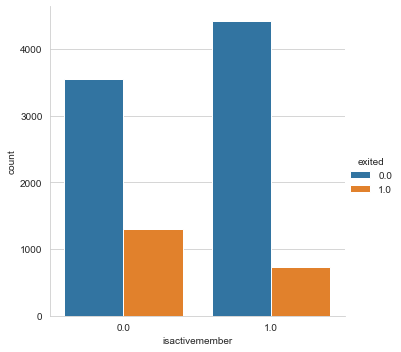

In [57]:
# Analyzing the data of the columns isactivemember
print(df["isactivemember"].value_counts())

print("\033[1mThe total number of customers that are not active is is", df["isactivemember"].value_counts()[0]) 
print("\033[1mThe total number of customers that are active is", df["isactivemember"].value_counts()[1]) 

#Plotting the number of customers along  HasCrCard variable with exited variable as a filter
sns.catplot(x='isactivemember',hue='exited',data=df,kind="count")

In [58]:
for i in df[numerical].drop(["hascrcard", "isactivemember"], axis=1):
    df[i].iplot(kind="box", title=i, boxpoints="all", color='lightseagreen')

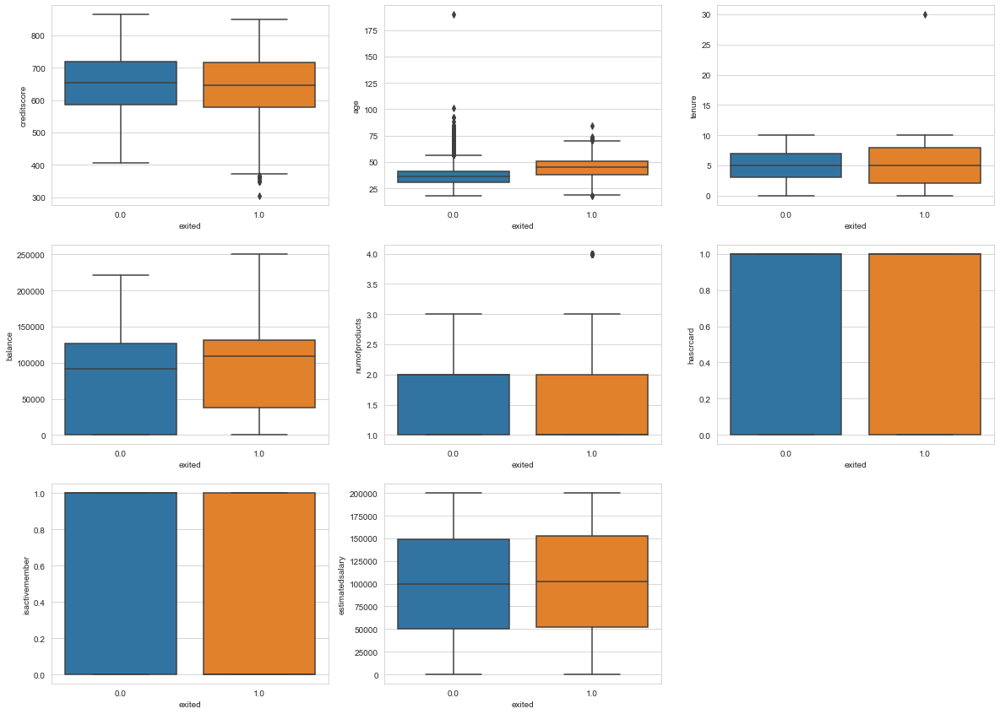

In [59]:
index = 0
plt.figure(figsize=(20,20))
for feature in numerical:
    if feature != "exited":
        index += 1
        plt.subplot(4, 3, index)
        sns.boxplot(x='exited', y=feature, data=df)

**I often use Plotly library. Plotly library is very useful for data visualization and understanding the data simply and easily. One of the visualization functions is scatter_3d() which is used to create a 3D scatter plot and can be used with pandas data frames.** 

**3D scatter plots are used to plot data points on three axes in an attempt to show the relationship between three variables. Each row in the data table is represented by a marker whose position depends on its values in the columns set on the X, Y, and Z axes. A fourth variable can be set to correspond to the color or size of the markers; thus, adding yet another dimension to the plot.**

In [60]:
#Plotting 3d Scatter plot
fig = px.scatter_3d(df, 
                    x='age',
                    y='estimatedsalary',
                    z='creditscore',
                    color='exited')
fig.show();

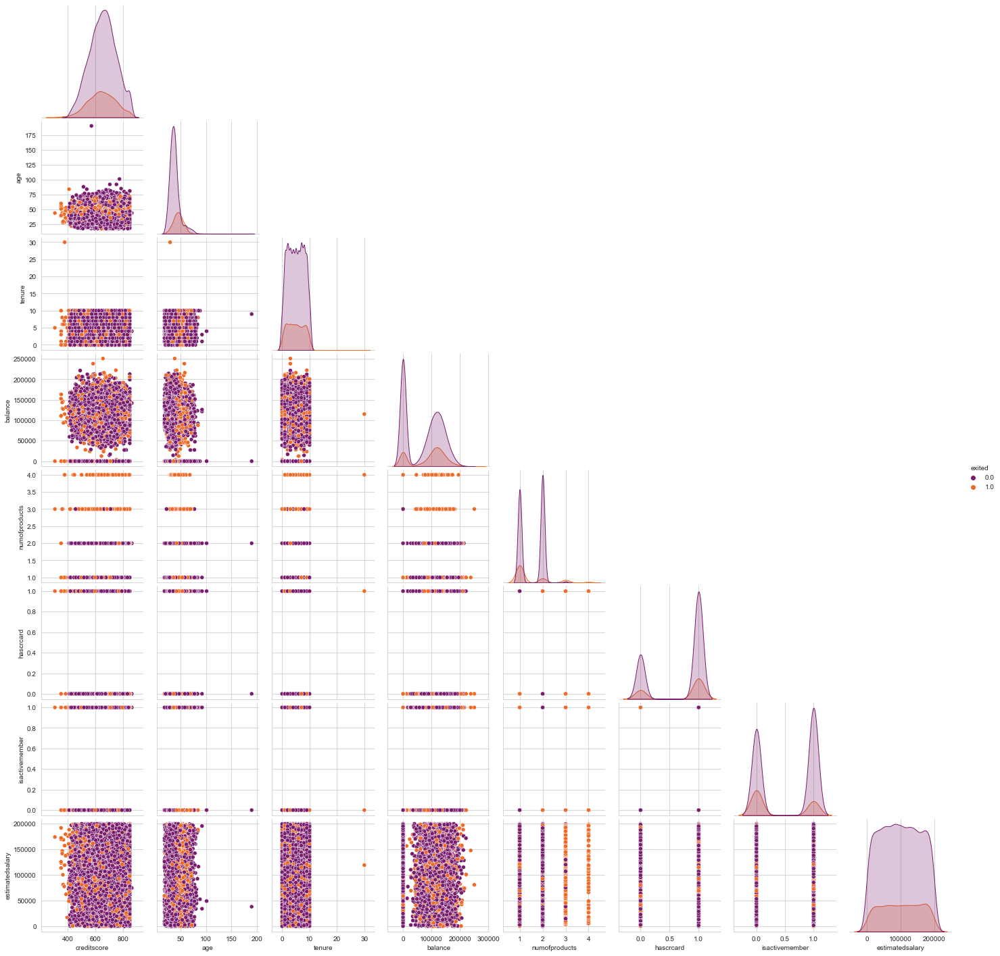

In [61]:
#Printing Pair plots for additional analysis
sns.pairplot(df, hue="exited", palette="inferno", corner=True);

<a id="4.6.3"></a>
#### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6.3 The Examination of Categorical Features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [62]:
df[categorical].head().T

,0,1,2,3,4
geography,France,Spain,France,France,Spain
gender,Female,Female,Female,Female,Female


In [63]:
df[categorical].describe().T.style.background_gradient(subset=['unique','freq','count'], cmap='RdPu')

,count,unique,top,freq
geography,10000,3,France,5014
gender,10000,3,Male,5453


In [64]:
df[categorical].nunique()

geography    3
gender       3
dtype: int64

**Now we can compare each categorical variable with target variable for the bivariate analysis.**

In [65]:
#Performing Bivariate analysis for each categorical variable
for i, col in enumerate(df[categorical].columns):
    fig = px.histogram(df[col], color=df["exited"], width=800, height=800, title=col, pattern_shape=df["hascrcard"], pattern_shape_sequence=["x", "+"])
    fig.show()

**Now, let's examine crosstab outputs for each variable.**

In [66]:
#Examining the cross tab outputs
for i, col in enumerate(df[categorical].columns):
    xtab = pd.crosstab(df[col], df["exited"], normalize=True)
    print(colored('-'*50, 'red', attrs=['bold']), sep='')
    print(xtab*100)

--------------------------------------------------
exited                   0.0               1.0
geography                                     
France                 42.04               8.1
Germany   16.950000000000003              8.14
Spain                  20.64 4.130000000000001
--------------------------------------------------
exited    0.0               1.0
gender                         
Female  34.02             11.37
Male    45.57 8.959999999999999
Neutral  0.04              0.04


**Swarmplot is the combination of a strip plot and a violin plot. Along with the number of data points, it also provides their respective distribution. Therefore, a swarm plot is a great way of demonstrating and assessing the distribution of an attribute or the joint distribution of a couple of attributes. Now, let's plot it.**

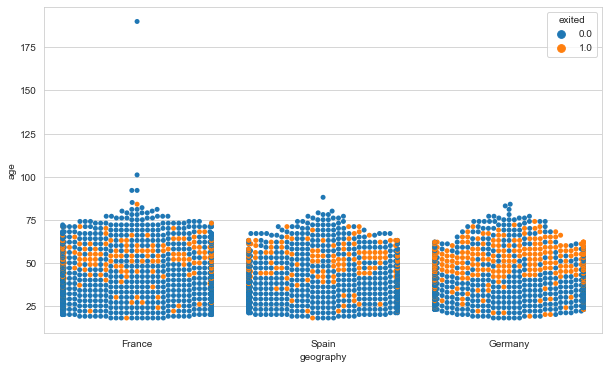

In [67]:
sns.swarmplot(y="age", x="geography", hue="exited", data=df);

In [68]:
df.head()

,creditscore,geography,gender,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited
0,619.0,France,Female,42.0,2.0,0.0,1.0,1.0,1.0,101348.88,1.0
1,608.0,Spain,Female,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0.0
2,502.0,France,Female,42.0,8.0,159660.8,3.0,1.0,0.0,113931.57,1.0
3,699.0,France,Female,39.0,1.0,0.0,2.0,0.0,0.0,93826.63,0.0
4,850.0,Spain,Female,43.0,2.0,125510.82,1.0,1.0,1.0,79084.1,0.0


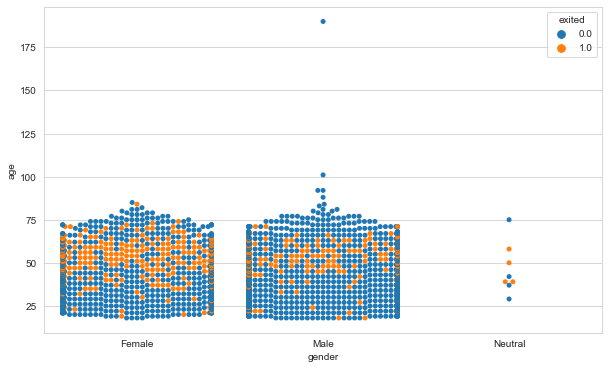

In [69]:
#Swarm plot
sns.swarmplot(y="age", x="gender", hue="exited", data=df);

**One important observation that is derived from the Swarm plots is that**

**1) The customers between ages 45 to 65 in both gender tend to close their accounts with banks as they are in vast majority as seen above. I will use this assumption while modeling in near future**


In [70]:
# Sorting the credit score
sorted_creditscore = df["creditscore"].sort_values()

In [71]:
#fig = px.scatter(df, x=df.age, animation_frame=sorted_creditscore, facet_col="exited")
#fig.show()


<a id="4.6.4"></a>
#### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.6.4 Treating categorical features</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Before constructing our model, we should convert categorical features into dummies/numerical features.**

**A common strategy for encoding categorical variables is "One-Hot", "Label" or "Dummy" encoding, where a new column is created for every N (or N-1) of the possible values, and those columns are given a value of 1 or 0 depending on whether the feature had that value.**

**In our study, we utilized "Dummy" encoding; however, instead of applying get_dummies() for conversion, you can also prefer one of other popular categorical encoding processes, Label Encoding or One-Hot Encoding techniques found in scikit-learn library.**

In [72]:
df.head(3)

,creditscore,geography,gender,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited
0,619.0,France,Female,42.0,2.0,0.0,1.0,1.0,1.0,101348.88,1.0
1,608.0,Spain,Female,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0.0
2,502.0,France,Female,42.0,8.0,159660.8,3.0,1.0,0.0,113931.57,1.0


In [73]:
categorical

Index(['geography', 'gender'], dtype='object')

In [74]:
df = pd.get_dummies(df, columns=['geography', 'gender'], drop_first=True)

In [75]:
df.head(3)

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited,geography_Germany,geography_Spain,gender_Male,gender_Neutral
0,619.0,42.0,2.0,0.0,1.0,1.0,1.0,101348.88,1.0,0,0,0,0
1,608.0,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0.0,0,1,0,0
2,502.0,42.0,8.0,159660.8,3.0,1.0,0.0,113931.57,1.0,0,0,0,0


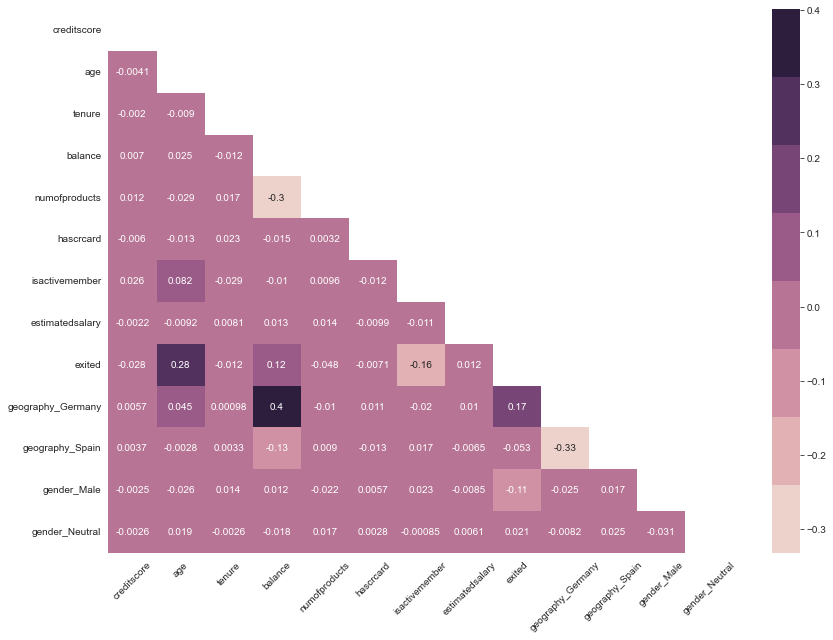

In [76]:
plt.figure(figsize=(14, 10))

# Getting the Upper Triangle of the co-relation matrix
matrix = np.triu(df.corr())

# using the upper triangle matrix as mask 
sns.heatmap(df.corr(), annot=True, cmap = sns.cubehelix_palette(8), mask=matrix)

plt.xticks(rotation=45);

<a id="4.7"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.7 Descriptive Statistics</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [77]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
creditscore,10000.00,650.50,96.69,305.00,584.00,652.00,717.25,865.00
age,10000.00,38.94,10.61,18.00,32.00,37.00,44.00,190.00
tenure,10000.00,5.02,2.90,0.00,3.00,5.00,7.25,30.00
balance,10000.00,76485.89,62397.41,0.00,0.00,97198.54,127644.24,250898.09
numofproducts,10000.00,1.53,0.58,1.00,1.00,1.00,2.00,4.00
hascrcard,10000.00,0.71,0.46,0.00,0.00,1.00,1.00,1.00
isactivemember,10000.00,0.52,0.50,0.00,0.00,1.00,1.00,1.00
estimatedsalary,10000.00,100090.24,57510.49,11.58,51002.11,100193.91,149388.25,199992.48
exited,10000.00,0.20,0.40,0.00,0.00,0.00,0.00,1.00
geography_Germany,10000.00,0.25,0.43,0.00,0.00,0.00,1.00,1.00


<a id="5"></a>
## <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">5 - DATA PREPROCESSING</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**First let's import related libraries.**

In [78]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

<a id="5.1"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.1 Train|Test Split Operations</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [79]:
df.insert(12, 'churn', df['exited'])

In [80]:
#Dropping the dependent variable
df.drop('exited', axis=1, inplace=True)

In [81]:
#Test run
df.head(3)

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,geography_Germany,geography_Spain,gender_Male,churn,gender_Neutral
0,619.0,42.0,2.0,0.0,1.0,1.0,1.0,101348.88,0,0,0,1.0,0
1,608.0,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0,1,0,0.0,0
2,502.0,42.0,8.0,159660.8,3.0,1.0,0.0,113931.57,0,0,0,1.0,0


In [82]:
X = df.drop('churn', axis=1)
y = df['churn'].values

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.15, random_state = 42)

<a id="5.2"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.2 Scaling Operation</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**MinMaxScaler is preferred for collecting data in a narrower range and for faster speed. So let's do it.**

**For a better understanding and more information, please refer to [external link text](https://www.analyticsvidhya.com/blog/2020/04/feature-scaling-machine-learning-normalization-standardization/) & [external link text](https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/)**

In [84]:
scaler = MinMaxScaler()

**To prevent data leakage, while we apply fit_transform() with X_train, we use transform() with X_test for scaling.**

In [124]:
X_scaled=scaler.fit_transform(X)
X_train_scaled= scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

<a id="6"></a>
## <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">6 - Modelling & Model Performance</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**Importing Related Libraries**

In [138]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dropout
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix ,classification_report,precision_score,recall_score,f1_score,average_precision_score
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn import model_selection 
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from statistics import mean
import lightgbm as lgb
from sklearn.pipeline import Pipeline
import sklearn.model_selection as md
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from statistics import mean
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')
pd.set_option("display.max_columns", 101)

In [86]:
X_train.shape

(8500, 12)

In [87]:
X_test.shape

(1500, 12)

## Implementing cross validation

In [88]:
##Getting Cross validation variables ready
Churn_cross_val = md.KFold(n_splits=10, random_state=1, shuffle=True)

<a id="6.1"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.1 Logistic Regression</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [89]:
#Building logistic model as the Base
np.random.seed(85)
Churn_Logistic_model = LogisticRegression()
#Fitting the model
Churn_Logistic_model.fit(X_train_scaled, y_train)

#Predicting the values
Churn_logregpred =Churn_Logistic_model.predict(X_test_scaled)

#Test accuracy with 10 fold cross validation
Churn_accuracy_Logreg = accuracy_score(y_test, Churn_logregpred)
conf_matrix = confusion_matrix(y_test, Churn_logregpred)
Class_report = classification_report(y_test, Churn_logregpred)
Churn_accuracy_logreg_Avg = cross_val_score(Churn_Logistic_model, X_test, y_test, scoring='accuracy', cv=Churn_cross_val, n_jobs=-1)

print('10 fold cross validated average accuracy score with logistic regression classifier is: {0:0.4f} percentage'. format(mean(Churn_accuracy_logreg_Avg)*100))
print('Model accuracy score with K nearest neighbour classifier is: {0:0.4f} percentage'. format(Churn_accuracy_Logreg*100))

print(f"Classification Report : \n{Class_report}")

print(f"Confusion Matrix : \n{conf_matrix}")

10 fold cross validated average accuracy score with logistic regression classifier is: 78.7333 percentage
Model accuracy score with K nearest neighbour classifier is: 80.5333 percentage
Classification Report : 
              precision    recall  f1-score   support

         0.0       0.82      0.97      0.89      1194
         1.0       0.58      0.17      0.26       306

    accuracy                           0.81      1500
   macro avg       0.70      0.57      0.57      1500
weighted avg       0.77      0.81      0.76      1500

Confusion Matrix : 
[[1157   37]
 [ 255   51]]


<a id="6.1"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.1 Visualizing top 10 features based on base logistic regression model</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

Feature: 0, Score: -0.41794
Feature: 1, Score: 10.00481
Feature: 2, Score: -0.14111
Feature: 3, Score: 0.61931
Feature: 4, Score: -0.36902
Feature: 5, Score: -0.05898
Feature: 6, Score: -0.96765
Feature: 7, Score: 0.18307
Feature: 8, Score: 0.80030
Feature: 9, Score: 0.02982
Feature: 10, Score: -0.52158
Feature: 11, Score: 0.69080


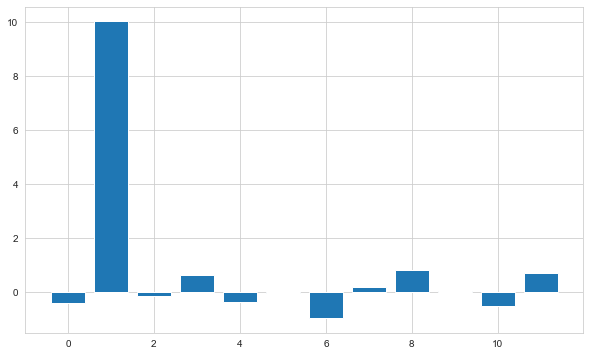

In [90]:
# Getting the importance from the model
imp_factor = Churn_Logistic_model.coef_[0]
# summarize feature importance
for i,v in enumerate(imp_factor):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(imp_factor))], imp_factor)
plt.show()

<a id="6.2"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2 K-Nearest Neighbor</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [91]:
#Using KNN for prediction
np.random.seed(85)
Churn_knn_model = KNeighborsClassifier(n_neighbors=8)
Churn_knn_model.fit(X_train_scaled, y_train)

#Predicting the values
Churn_knn_pred = Churn_knn_model.predict(X_test_scaled)

Churn_accuracy_knn = accuracy_score(y_test, Churn_knn_pred)
conf_matrix = confusion_matrix(y_test, Churn_knn_pred)
Class_report = classification_report(y_test, Churn_knn_pred)

print('Model accuracy score with K nearest neighbour classifier is: {0:0.4f} percentage'. format(Churn_accuracy_knn*100))

print(f"Classification Report : \n{Class_report}")

print(f"Confusion Matrix : \n{conf_matrix}")

Model accuracy score with K nearest neighbour classifier is: 80.2667 percentage
Classification Report : 
              precision    recall  f1-score   support

         0.0       0.82      0.96      0.89      1194
         1.0       0.55      0.18      0.27       306

    accuracy                           0.80      1500
   macro avg       0.69      0.57      0.58      1500
weighted avg       0.77      0.80      0.76      1500

Confusion Matrix : 
[[1150   44]
 [ 252   54]]


In [92]:
#lets see what happens when we variate neighbors for k inrange(1,50):
from sklearn.metrics import mean_absolute_error
k_val=[]
train_accuracy=[]
test_accuracy=[]
list_training_error = []
list_testing_error = []
for k in range(1,50):
    knn = KNeighborsClassifier(n_neighbors = k)
    k_val.append(k)
    knn.fit(X_train, y_train)
    pred_train= knn.predict(X_train)
    train_accuracy.append(accuracy_score(y_train, pred_train))
    pred_test = knn.predict(X_test)
    test_accuracy.append(accuracy_score(y_test, pred_test))
    fold_training_error = mean_absolute_error(y_train, pred_train)
    fold_testing_error = mean_absolute_error(y_test, pred_test)
list_training_error.append(fold_training_error)

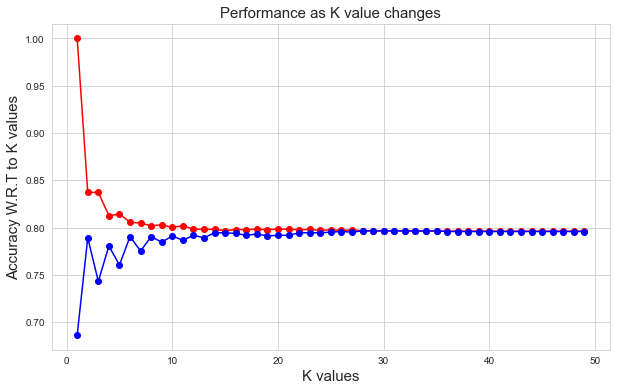

In [93]:
#Plotting train and test errors
np.random.seed(85)
import matplotlib.pyplot as plt
plt.plot(k_val,train_accuracy,color='red',marker='o')
plt.plot(k_val,test_accuracy,color='blue',marker='o')
plt.title('Performance as K value changes', fontsize=15)
plt.xlabel('K values', fontsize=15)
plt.ylabel('Accuracy W.R.T to K values', fontsize=15)
plt.grid(True)
plt.show()

<a id="6.3"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.3 Decision Tree CLassifier</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [94]:
#Decision Tree Classifier with 10 fold cross validation 
np.random.seed(85)
Churn_dtc = DecisionTreeClassifier()
Churn_dtc.fit(X_train, y_train)

y_pred_Churn_dtc = Churn_dtc.predict(X_test)

Churn_accuracy_dtc = accuracy_score(y_test, y_pred_Churn_dtc)
conf_matrix = confusion_matrix(y_test, y_pred_Churn_dtc)
Class_report = classification_report(y_test, y_pred_Churn_dtc)
Churn_accuracy_DT_Avg = cross_val_score(Churn_dtc, X_test, y_test, scoring='accuracy', cv=Churn_cross_val, n_jobs=-1)

print('10 fold cross validated average accuracy score with Decision Trees classifier is: {0:0.4f} percentage'. format(mean(Churn_accuracy_DT_Avg)*100))

print(f"Classification Report : \n{Class_report}")

print(f"Confusion Matrix : \n{conf_matrix}")

10 fold cross validated average accuracy score with Decision Trees classifier is: 78.6667 percentage
Classification Report : 
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87      1194
         1.0       0.49      0.53      0.51       306

    accuracy                           0.79      1500
   macro avg       0.68      0.69      0.69      1500
weighted avg       0.80      0.79      0.79      1500

Confusion Matrix : 
[[1027  167]
 [ 145  161]]


<a id="6.4"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.4 Random Forest Classifier</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [95]:
#Random forest classifier with 10 fold cross validation
np.random.seed(85)
Churn_Random_forest_model = RandomForestClassifier()
Churn_Random_forest_model.fit(X_train, y_train)

y_pred_Churn_RF = Churn_Random_forest_model.predict(X_test)

Churn_accuracy_RF = accuracy_score(y_test, y_pred_Churn_RF)
conf_matrix = confusion_matrix(y_test, y_pred_Churn_RF)
Class_report = classification_report(y_test, y_pred_Churn_RF)
Churn_accuracy_RF_Avg = cross_val_score(Churn_Random_forest_model, X_test, y_test, scoring='accuracy', cv=Churn_cross_val, n_jobs=-1)

print('10 fold cross validated average accuracy score with Random forest classifier is: {0:0.4f} percentage'. format(mean(Churn_accuracy_RF_Avg)*100))

print(f"Classification Report : \n{Class_report}")

print(f"Confusion Matrix : \n{conf_matrix}")

10 fold cross validated average accuracy score with Random forest classifier is: 85.4667 percentage
Classification Report : 
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91      1194
         1.0       0.73      0.45      0.56       306

    accuracy                           0.85      1500
   macro avg       0.80      0.70      0.73      1500
weighted avg       0.84      0.85      0.84      1500

Confusion Matrix : 
[[1144   50]
 [ 169  137]]


<a id="6.5"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.5 Ada Boost CLassifier</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [96]:
# Ada Boost CLassifier
Churn_ada = AdaBoostClassifier(base_estimator = Churn_dtc)
np.random.seed(85)
Churn_ada.fit(X_train, y_train)

y_pred_Churn_ada = Churn_ada.predict(X_test)

Hotel_accuracy_ada = accuracy_score(y_test, y_pred_Churn_ada)
conf_matrix = confusion_matrix(y_test, y_pred_Churn_ada)
Class_report = classification_report(y_test, y_pred_Churn_ada)
Churn_accuracy_ADA_Avg = cross_val_score(Churn_ada, X_test, y_test, scoring='accuracy', cv=Churn_cross_val, n_jobs=-1)

print('10 fold cross validated average accuracy score with Ada Boost classifier is: {0:0.4f} percentage'. format(mean(Churn_accuracy_ADA_Avg)*100))

print(f"Classification Report : \n{Class_report}")

print(f"Confusion Matrix : \n{conf_matrix}")

10 fold cross validated average accuracy score with Ada Boost classifier is: 77.5333 percentage
Classification Report : 
              precision    recall  f1-score   support

         0.0       0.87      0.86      0.86      1194
         1.0       0.47      0.51      0.49       306

    accuracy                           0.78      1500
   macro avg       0.67      0.68      0.68      1500
weighted avg       0.79      0.78      0.79      1500

Confusion Matrix : 
[[1022  172]
 [ 151  155]]


<a id="6.6"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.6 XgBoost Classifier</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [97]:
#The King of classifiers XGBoost is here
np.random.seed(85)
Churn_xgb = XGBClassifier(booster = 'gbtree', learning_rate = 0.1, max_depth = 5, n_estimators = 180)
Churn_xgb.fit(X_train, y_train)

y_pred_Churn_xgb = Churn_xgb.predict(X_test)

Churn_accuracy_xgb = accuracy_score(y_test, y_pred_Churn_xgb)
conf_matrix = confusion_matrix(y_test, y_pred_Churn_xgb)
Class_report = classification_report(y_test, y_pred_Churn_xgb)

print('Model accuracy score with XG Boost classifier is: {0:0.4f} percentage'. format(Churn_accuracy_xgb*100))

print(f"Classification Report : \n{Class_report}")

print(f"Confusion Matrix : \n{conf_matrix}")

[17:11:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Model accuracy score with XG Boost classifier is: 85.8000 percentage
Classification Report : 
              precision    recall  f1-score   support

         0.0       0.88      0.95      0.91      1194
         1.0       0.73      0.48      0.58       306

    accuracy                           0.86      1500
   macro avg       0.80      0.72      0.75      1500
weighted avg       0.85      0.86      0.85      1500

Confusion Matrix : 
[[1140   54]
 [ 159  147]]



<a id="6.7"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.7 CatBoost Classifier</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [98]:
#Implimenting Cat Boost classifier with cross validation
np.random.seed(85)
Churn_cat = CatBoostClassifier(iterations=200,silent=True)
Churn_cat.fit(X_train, y_train)

y_pred_Churncat = Churn_cat.predict(X_test)

Churn_accuracy_cat = accuracy_score(y_test, y_pred_Churncat)
conf_matrix = confusion_matrix(y_test, y_pred_Churncat)
Class_report = classification_report(y_test, y_pred_Churncat)
Chrun_accuracy_cat_Avg = cross_val_score(Churn_cat, X_test, y_test, scoring='accuracy', cv=Churn_cross_val, n_jobs=-1)


print(' 10 fold cross validated average accuracy score with Cat Boost classifier is: {0:0.4f} percentage'. format(mean(Chrun_accuracy_cat_Avg)*100))

print(f"Classification Report : \n{Class_report}")

print(f"Confusion Matrix : \n{conf_matrix}")

 10 fold cross validated average accuracy score with Cat Boost classifier is: 85.8667 percentage
Classification Report : 
              precision    recall  f1-score   support

         0.0       0.88      0.96      0.92      1194
         1.0       0.75      0.51      0.61       306

    accuracy                           0.87      1500
   macro avg       0.82      0.73      0.76      1500
weighted avg       0.86      0.87      0.85      1500

Confusion Matrix : 
[[1143   51]
 [ 151  155]]


<a id="6.8"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.8  LGBM Classifier</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [99]:
#Implimenting LGBM classifier
np.random.seed(85)
Churn_lgbm = LGBMClassifier(learning_rate = 1)
Churn_lgbm.fit(X_train, y_train)

y_pred_Churnlgbm = Churn_cat.predict(X_test)

Churn_accuracy_lgbm = accuracy_score(y_test, y_pred_Churnlgbm)
conf_matrix = confusion_matrix(y_test, y_pred_Churnlgbm)
Class_report = classification_report(y_test, y_pred_Churnlgbm)



print(' Accuracy score with Light Gradient(LGBM) classifier is: {0:0.4f} percentage'. format(Churn_accuracy_lgbm*100))

print(f"Classification Report : \n{Class_report}")

print(f"Confusion Matrix : \n{conf_matrix}")

 Accuracy score with Light Gradient(LGBM) classifier is: 86.5333 percentage
Classification Report : 
              precision    recall  f1-score   support

         0.0       0.88      0.96      0.92      1194
         1.0       0.75      0.51      0.61       306

    accuracy                           0.87      1500
   macro avg       0.82      0.73      0.76      1500
weighted avg       0.86      0.87      0.85      1500

Confusion Matrix : 
[[1143   51]
 [ 151  155]]


<a id="6.9"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;"> 6.9 Neural networks Modeling Without "class_weigth"</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

**"Sigmoid" activation function is also a logistic function, compressing data between 0 and 1. Therefore, it would be more correct to use this function in the output layer. Moreover, we used "binary_crossentropy" as the loss metric since the output is binary and "relu" is used in hidden layers since learning usually happens faster.**

In [100]:
model = Sequential()

model.add(Dense(32, activation = "relu"))  # sigunt ve hiperb. e göre öğrenme daha fazla olduğu için relu kullandık.
model.add(Dense(16, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))  # output binary olduğu için sigmoid kullandık. 

model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

**Early stopping is a method that allows you to specify an arbitrary large number of training epochs and stop training once the model performance stops improving on a hold out validation dataset.**

**Additionally, for preventing data leakage, "dropout" can be used. The Dropout layer randomly sets input units to 0 with a frequency of rate at each step during training time, which helps prevent overfitting.**

**For a better understanding and more information, please refer to [external link text](https://machinelearningmastery.com/how-to-stop-training-deep-neural-networks-at-the-right-time-using-early-stopping/#:~:text=Early%20stopping%20is%20a%20method,deep%20learning%20neural%20network%20models.)**

In [101]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 20)

**While modelling, we reserved 10% of the data to be used for training. We do not train this reserved part in any way. It will be used for validation.**

In [102]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose = 1,
          callbacks = [early_stop])

Epoch 1/1000
240/240 [==============================] - 1s 1ms/step - loss: 1338.1428 - accuracy: 0.6780 - val_loss: 91.8587 - val_accuracy: 0.8000
Epoch 2/1000
240/240 [==============================] - 0s 696us/step - loss: 102.3671 - accuracy: 0.7042 - val_loss: 92.2894 - val_accuracy: 0.8000
Epoch 3/1000
240/240 [==============================] - 0s 676us/step - loss: 142.8644 - accuracy: 0.6894 - val_loss: 109.8526 - val_accuracy: 0.8000
Epoch 4/1000
240/240 [==============================] - 0s 688us/step - loss: 124.5248 - accuracy: 0.6908 - val_loss: 110.0499 - val_accuracy: 0.7129
Epoch 5/1000
240/240 [==============================] - 0s 667us/step - loss: 105.3761 - accuracy: 0.6962 - val_loss: 78.5063 - val_accuracy: 0.8000
Epoch 6/1000
240/240 [==============================] - 0s 661us/step - loss: 110.4278 - accuracy: 0.6997 - val_loss: 76.8384 - val_accuracy: 0.8000
Epoch 7/1000
240/240 [==============================] - 0s 667us/step - loss: 120.5698 - accuracy: 0.6885

Epoch 56/1000
240/240 [==============================] - 0s 664us/step - loss: 40.0983 - accuracy: 0.6826 - val_loss: 73.4058 - val_accuracy: 0.4612
Epoch 57/1000
240/240 [==============================] - 0s 705us/step - loss: 50.2294 - accuracy: 0.6858 - val_loss: 137.3509 - val_accuracy: 0.2294
Epoch 58/1000
240/240 [==============================] - 0s 663us/step - loss: 43.3641 - accuracy: 0.6844 - val_loss: 30.8666 - val_accuracy: 0.8024
Epoch 59/1000
240/240 [==============================] - 0s 663us/step - loss: 37.7594 - accuracy: 0.6905 - val_loss: 160.1560 - val_accuracy: 0.3024
Epoch 60/1000
240/240 [==============================] - 0s 659us/step - loss: 48.4614 - accuracy: 0.6876 - val_loss: 67.0771 - val_accuracy: 0.8000
Epoch 61/1000
240/240 [==============================] - 0s 659us/step - loss: 34.3265 - accuracy: 0.6932 - val_loss: 54.8884 - val_accuracy: 0.8000
Epoch 62/1000
240/240 [==============================] - 0s 665us/step - loss: 40.1868 - accuracy: 0.696

<a id="6.9.1"></a>
#### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.9.1 The Evaluation of Model with Default Parameters (without class_weigth)</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [103]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                416       
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 961
Trainable params: 961
Non-trainable params: 0
_________________________________________________________________


**As the iterations progressed, while loss and val_loss values decreased, the accuracy and val_accurasy values also increased.**

In [104]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

,loss,accuracy,val_loss,val_accuracy
0,1338.142822265625,0.6780391931533813,91.85867309570312,0.800000011920929
1,102.36713409423828,0.7041829824447632,92.28942108154297,0.800000011920929
2,142.86436462402344,0.6894117593765259,109.85259246826172,0.800000011920929
3,124.52481842041016,0.6908496618270874,110.04993438720703,0.7129411697387695
4,105.37606048583984,0.6962091326713562,78.50628662109375,0.800000011920929


**Let's plot and examine the "loss", "accuracy", "val_loss" and	"val_accuracy" curves.** 

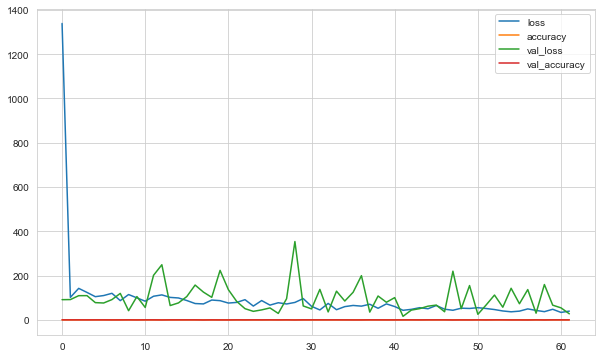

In [105]:
loss_df.plot();

In [106]:
model.evaluate(X_test, y_test, verbose=0)

[25.463031768798828, 0.768666684627533]

In [107]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)

print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  25.463031768798828
accuracy :  0.768666684627533


In [108]:
y_pred = (model.predict(X_test) > 0.5).astype("int32")   

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[1124   70]
 [ 277   29]]
              precision    recall  f1-score   support

         0.0       0.80      0.94      0.87      1194
         1.0       0.29      0.09      0.14       306

    accuracy                           0.77      1500
   macro avg       0.55      0.52      0.50      1500
weighted avg       0.70      0.77      0.72      1500



<a id="6.9.2"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.9.2 Modelling With Best Parameters (GridsearchCV)</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [109]:
def build_classifier(optimizer):
    classifier = Sequential()
    classifier.add(Dense(units = 32, activation = 'relu'))
    classifier.add(Dense(units = 16, activation = 'relu'))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])
    return classifier

In [110]:
early_stop = EarlyStopping(monitor = "accuracy", mode = "auto", verbose = 1, patience = 20)

In [111]:
class_weight = {0: 0.62787777, 1: 2.45499182}

In [112]:
classifier = KerasClassifier(build_fn = build_classifier, epochs = 200)

parameters = {'batch_size': [32, 64],
              'optimizer': ['adam', 'rmsprop', "SGD", "adagrad", "adadelta"]}

grid_model = GridSearchCV(estimator = classifier,
                          param_grid = parameters,
                          scoring = 'accuracy',
                          cv = 10,
                          n_jobs = -1,
                          verbose = 1)

grid_model.fit(X_train, y_train, callbacks = [early_stop], class_weight = class_weight)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Epoch 1/200
266/266 [==============================] - 0s 609us/step - loss: 10950.9961 - accuracy: 0.2041
Epoch 2/200
266/266 [==============================] - 0s 607us/step - loss: 10639.8086 - accuracy: 0.2041
Epoch 3/200
266/266 [==============================] - 0s 613us/step - loss: 10282.3691 - accuracy: 0.2041
Epoch 4/200
266/266 [==============================] - 0s 560us/step - loss: 9887.4600 - accuracy: 0.2041
Epoch 5/200
266/266 [==============================] - 0s 560us/step - loss: 9461.2021 - accuracy: 0.2041
Epoch 6/200
266/266 [==============================] - 0s 568us/step - loss: 9002.5107 - accuracy: 0.2041
Epoch 7/200
266/266 [==============================] - 0s 621us/step - loss: 8516.9756 - accuracy: 0.2041
Epoch 8/200
266/266 [==============================] - 0s 613us/step - loss: 8009.1914 - accuracy: 0.2041
Epoch 9/200
266/266 [==============================] - 0s 620us/step - loss: 7480.3647

GridSearchCV(cv=10,
             estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x00000156A8D39190>,
             n_jobs=-1,
             param_grid={'batch_size': [32, 64],
                         'optimizer': ['adam', 'rmsprop', 'SGD', 'adagrad',
                                       'adadelta']},
             scoring='accuracy', verbose=1)

In [113]:
grid_model.best_score_

0.6321176470588236

In [114]:
grid_model.best_params_

{'batch_size': 32, 'optimizer': 'adadelta'}

In [115]:
y_pred = (grid_model.predict(X_test) > 0.5).astype("int32")
#y_pred = model.predict_classes(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[484 710]
 [139 167]]
              precision    recall  f1-score   support

         0.0       0.78      0.41      0.53      1194
         1.0       0.19      0.55      0.28       306

    accuracy                           0.43      1500
   macro avg       0.48      0.48      0.41      1500
weighted avg       0.66      0.43      0.48      1500



<a id="6.9.3"></a>
#### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.9.3 The Evaluation of ROC and AUC for Model without "class_weigth"</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

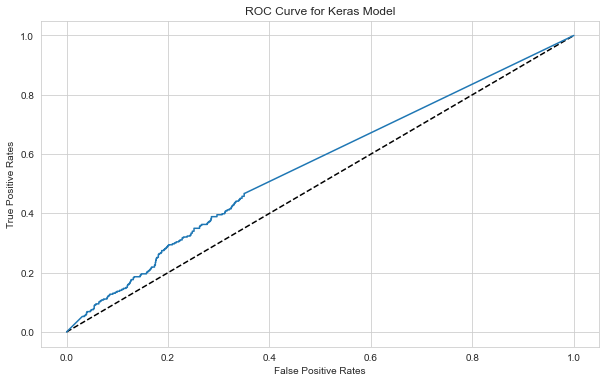

In [116]:
y_pred_proba = model.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('False Positive Rates')
plt.ylabel('True Positive Rates')
plt.title('ROC Curve for Keras Model')
plt.show()

In [117]:
roc_auc_score(y_test, y_pred_proba)

0.5594954620597541

<a id="6.3.2"></a>
#### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.3.2 The Evaluation of ROC and AUC for GridsearchCV Model"</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

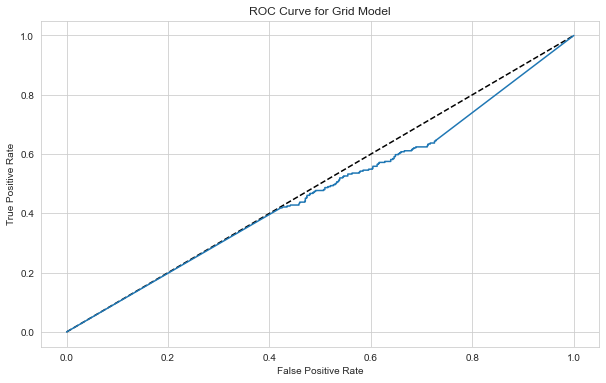

In [118]:
y_pred_proba = grid_model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Grid Model')
plt.show()

In [119]:
roc_auc_score(y_test, y_pred_proba)

0.47549567007149035

<a id="7"></a>
## <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7 - Final Model & Model Deployment</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

<a id="7.1"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">7.1 Voting for the the best model and saving it</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [120]:
warnings.filterwarnings('ignore')
#Building the Hotel voting Classifier
Churn_classifiers = [ ('Cat Boost Classifier', Churn_cat), ('XGboost Classifier', Churn_xgb),  
               ('LGBM CLassifier', Churn_lgbm), ('Decision Tree Classifier', Churn_dtc),('Random Forest Classifier', Churn_Random_forest_model), ('Ada Boost Classfier', Churn_ada), ('Logistic Regression', Churn_Logistic_model),
               ('Knn classifier', Churn_knn_model),('classifier', Churn_knn_model)]
Churn_vot_cls = VotingClassifier(estimators = Churn_classifiers)
Churn_vot_cls.fit(X_train, y_train)

y_pred_vot_cls = Churn_vot_cls.predict(X_test)

Churn_accuracy_vot_lcs = accuracy_score(y_test, y_pred_vot_cls)
conf_matrix = confusion_matrix(y_test, y_pred_vot_cls)
Class_report = classification_report(y_test, y_pred_vot_cls)




print(' Accuracy score with Voting classifier is: {0:0.4f} percentage'. format(Churn_accuracy_vot_lcs*100))

print(f"Classification Report : \n{Class_report}")

print(f"Confusion Matrix : \n {conf_matrix}")

[17:13:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
 Accuracy score with Voting classifier is: 85.2667 percentage
Classification Report : 
              precision    recall  f1-score   support

         0.0       0.86      0.98      0.91      1194
         1.0       0.80      0.37      0.51       306

    accuracy                           0.85      1500
   macro avg       0.83      0.67      0.71      1500
weighted avg       0.85      0.85      0.83      1500

Confusion Matrix : 
 [[1165   29]
 [ 192  114]]


In [122]:
#Building data frame with accuracy to visualize the given evaluation Metric Accuracy
Churn_models = pd.DataFrame({
    'Churn_Model' : ['Logisitc Regression CLassifier','Cat Boost Classifier', 'KNN classfier', 'Decision Tree Classifier', 'Random Forest Classifier','Ada Boost Classifier',
             'XgBoost',  'LGBM Classifier', 'Voting Classifier'],
    'Model_Score' : [mean(Churn_accuracy_logreg_Avg),Churn_accuracy_cat, Churn_accuracy_knn, Churn_accuracy_dtc, mean(Churn_accuracy_RF_Avg), mean(Churn_accuracy_ADA_Avg), Churn_accuracy_xgb, Churn_accuracy_lgbm, Churn_accuracy_vot_lcs]
})


round(Churn_models.sort_values(by = 'Model_Score', ascending = False),2)

,Churn_Model,Model_Score
1,Cat Boost Classifier,0.87
7,LGBM Classifier,0.87
6,XgBoost,0.86
4,Random Forest Classifier,0.85
8,Voting Classifier,0.85
2,KNN classfier,0.8
3,Decision Tree Classifier,0.79
0,Logisitc Regression CLassifier,0.79
5,Ada Boost Classifier,0.78


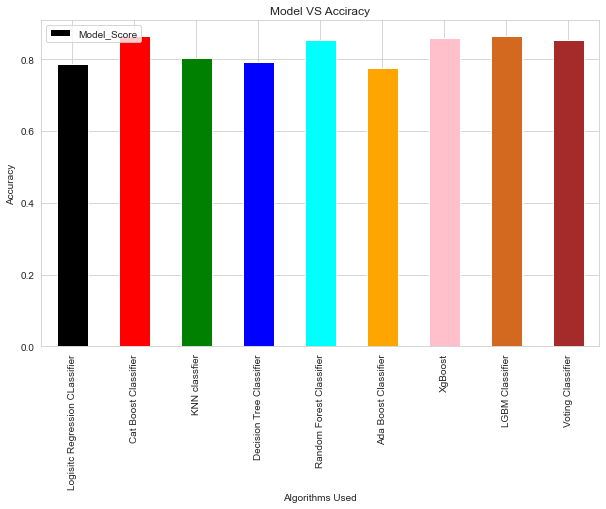

In [123]:

Churn_models.plot(x ='Churn_Model', y='Model_Score', kind = 'bar',color=['black', 'red', 'green', 'blue', 'cyan','orange','pink','chocolate','brown'])
plt.xlabel("Algorithms Used")
plt.ylabel("Accuracy")
plt.title('Model VS Acciracy')
plt.show()

<a id="7.2"></a>
### <p style="background-color:#0051A5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">7.2 Handling class imbalance using Upsampling </p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#e9a1ed" data-toggle="popover">Table of Contents</a>

In [130]:
from imblearn.over_sampling import SMOTE
X = X_scaled
sm  = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size= 0.15,random_state=42)

In [139]:
Churn_clf_final = XGBClassifier(max_depth = 12,random_state=7, n_estimators=100, eval_metric = 'auc', min_child_weight = 3,
                    colsample_bytree = 0.75, subsample= 0.8)
Churn_clf_final.fit(X_train, y_train)

y_pred = Churn_clf_final.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1:", f1_score(y_test, y_pred))
print("Area under precision (AUC) Recall:", average_precision_score(y_test, y_pred))

Accuracy: 0.9037254081205526
Precision: 0.911190053285968
Recall: 0.8875432525951558
F1: 0.8992112182296231
Area under precision (AUC) Recall: 0.8631366572967734


**Concluding remarks**

1) Out of all the algorithms we can either use ensemble models like  **XGBoost, LBGM Boost or Voting classifier** as our final model as they have high recall and accuracy scores.

2) When We use Upsampling and then find the accuracy the accuracy value reaches more than 90%.

## Resources

1) Stack Overflow
2) Kaggle
3) Github chats
4) Google